# <center>Workshop DINGO, 23. August 2022</center>
<img src="https://dingo.readthedocs.io/en/dev/_images/DING0_Logo_300px.png" alt="open_eGo-Logo" height="200" width="200"  align="center">

In [1]:
__copyright__ = "Reiner Lemoine Institut gGmbH"
__license__   = "GNU Affero General Public License Version 3 (AGPL-3.0)"
__url__       = "https://github.com/openego/eDisGo/blob/master/LICENSE"
__author__    = "nesnoj"

**Wichtige Links**

* __[DINGO Source Code](https://github.com/openego/ding0)__
* __[DINGO Documentation](http://dingo.readthedocs.io)__
* __[open_eGo Projekt-Website](https://openegoproject.wordpress.com)__
* __[Ergebnisse des Workshops](https://openegoproject.wordpress.com/ergebnisse/)__

# Inhalt

* [1 Einstieg](#einstieg)
* [2 Annahmen anpassen](#annahmen)
* [3 Datenbankverbindung aufbauen](#db)
* [4 DINGO ausführen](#dingo)
* [5 DINGO ausführen - en Detail](#dingo-detail)
* [6 Ergebnisse](#results)
* [7 In DINGOs Datenmodell arbeiten](#use-dingo)
* [8 Netz exportieren](#export)

# 1 Einstieg <a class="anchor" id="einstieg"></a>

DINGO (**DI**stribution **N**etwork **G**enerat**O**r) generiert synthetische Verteilnetze auf der Mittel -und Niederspannungsebene.

Für das vorliegende Notebook wird DINGO in der Version 0.2.1 benötigt. Für die Erstellung werden Daten von der [OpenEnergy Platform](https://openenergy-platform.org/) (OEP) benötigt.

**Anmerkung zum Plotting:** Optional: Damit in den Plots eine Hintergrundkarte geladen werden kann, wird das Paket `contextily` benötigt, welches nicht in den erforderlichen Paketen der `setup.py` enthalten ist (Installation per `pip install contextily`).

Mit `%%capture` kann DINGOs Ausgabe in diesem Notebook zugunsten der Übersichtlichkeit unterdrückt werden (auskommentieren, um alle Ausgaben anzuzeigen).

In [2]:
%%capture

from ding0.core import NetworkDing0
from ding0.tools.logger import setup_logger
from ding0.tools.results import save_nd_to_pickle
from ding0.tools.plots import plot_mv_topology
from egoio.tools import db
from sqlalchemy.orm import sessionmaker
import oedialect

# create new network
nd = NetworkDing0(name='network')
# set ID of MV grid district
mv_grid_districts = [460]

# 2 Annahmen anpassen <a class="anchor" id="annahmen"></a>
DINGO verfügt über einen [config-Ordner](https://github.com/openego/ding0/tree/master/ding0/config), in dem alle relevanten Konfigurationen vorgenommen werden können. Hierzu zählen beispielsweise die zu verwendenden DB-Tabellen auf der OEP, Betriebsmittel und zulässige Spannungsbänder.
Die Konfiguration wird beim Start ausgelesen und in die `NetworkDing0`-Instanz geschrieben.

Die Konfiguration umfasst:

In [3]:
for key, cfg in nd.config.items():
    print('[ {k} ]'.format(k=key))
    for param, val in cfg.items():
        print('    {k}: {v}'.format(k=param, v=val))

[ config ]
    config_dir: .ding0
    db_config_file: db_config.cfg
[ equipment ]
    equipment_mv_parameters_trafos: equipment-parameters_MV_transformers.csv
    equipment_mv_parameters_cables: equipment-parameters_MV_cables.csv
    equipment_mv_parameters_lines: equipment-parameters_MV_overhead_lines.csv
    equipment_lv_parameters_trafos: equipment-parameters_LV_transformers.csv
    equipment_lv_parameters_cables: equipment-parameters_LV_cables.csv
[ model_grids ]
    model_grids_lv_string_properties: model_grids-lv_string_properties.csv
    model_grids_lv_apartment_string: model_grids-lv_relation_apartment_string.csv
[ output ]
    animation_file_prefix: mv-routing_ani_
    nd_pickle: ding0_grids_{}.pkl
    edges_stats: mvgd_edges_stats_{}.csv
    nodes_stats: mvgd_nodes_stats_{}.csv
[ model_draft ]
    mv_grid_districts: EgoGridMvGriddistrict
    lv_load_areas: EgoDemandLoadarea
    lv_grid_district: EgoGridLvGriddistrict
    mv_stations: EgoGridHvmvSubstation
    lv_stations: Ego

# 3 Datenbankverbindung aufbauen <a class="anchor" id="db"></a>
DINGO verwendet Module des [ego.io](https://github.com/openego/ego.io)-Package für den Zugriff auf die OpenEnergy Platform. Für den hier verwendeten Lesebetrieb ist kein Account auf der OEP erforderlich.

(Für Schreibzugriffe wird hingegen ein Account benötigt. `section` bezieht sich auf die Sektion in der ego.io-Konfiguration, in welcher die Verbindung konfiguriert wird.)

In [4]:
engine = db.connection(readonly=True)
session = sessionmaker(bind=engine)()

# 4 DINGO ausführen <a class="anchor" id="dingo"></a>
DINGO kann in einem Schritt ausgeführt werden, in dem die entsprechende Methode von `NetworkDing0` aufgerufen wird:

In [5]:
#nd.run_ding0(session=session,
#             mv_grid_districts_no=mv_grid_districts)


Stattdessen wollen wir jedoch ein wenig ins Detail gehen:

# 5 DINGO ausführen - en Detail <a class="anchor" id="dingo-detail"></a>
Einzelschritte der Methode [`NetworkDing0.run_ding0()`](https://github.com/openego/ding0/blob/master/ding0/core/__init__.py#L105)

## 5.1 Daten importieren

In [6]:
nd.import_mv_grid_districts(session,
                            mv_grid_districts_no=mv_grid_districts)
nd.import_generators(session)

Generator Generator_mvgd_460_lvgd_402809_hydro_863757 has no la_id and was assigned to a random LV Grid District (lv_grid_district_402809).
Generator Generator_mvgd_460_lvgd_133650_hydro_873919 has no la_id and was assigned to a random LV Grid District (lv_grid_district_133650).
Generator Generator_mvgd_460_lvgd_133447_hydro_874864 has no la_id and was assigned to a random LV Grid District (lv_grid_district_133447).
Generator Generator_mvgd_460_lvgd_135392_hydro_874866 has no la_id and was assigned to a random LV Grid District (lv_grid_district_135392).


## 5.2 Netze parametrieren und Import validieren

In [7]:
nd.mv_parametrize_grid()
nd.validate_grid_districts()

[]

## 5.3 NS-Netze generieren

In [8]:
nd.build_lv_grids()

## 5.4 MS-Netze generieren

In [9]:
nd.mv_routing()

In [10]:
grid = nd._mv_grid_districts[0].mv_grid

# enable jupyter interactive plotting
%matplotlib inline
import matplotlib
matplotlib.rcParams['figure.figsize'] = (8, 8)
matplotlib.rcParams['figure.dpi'] = 300

/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is dep

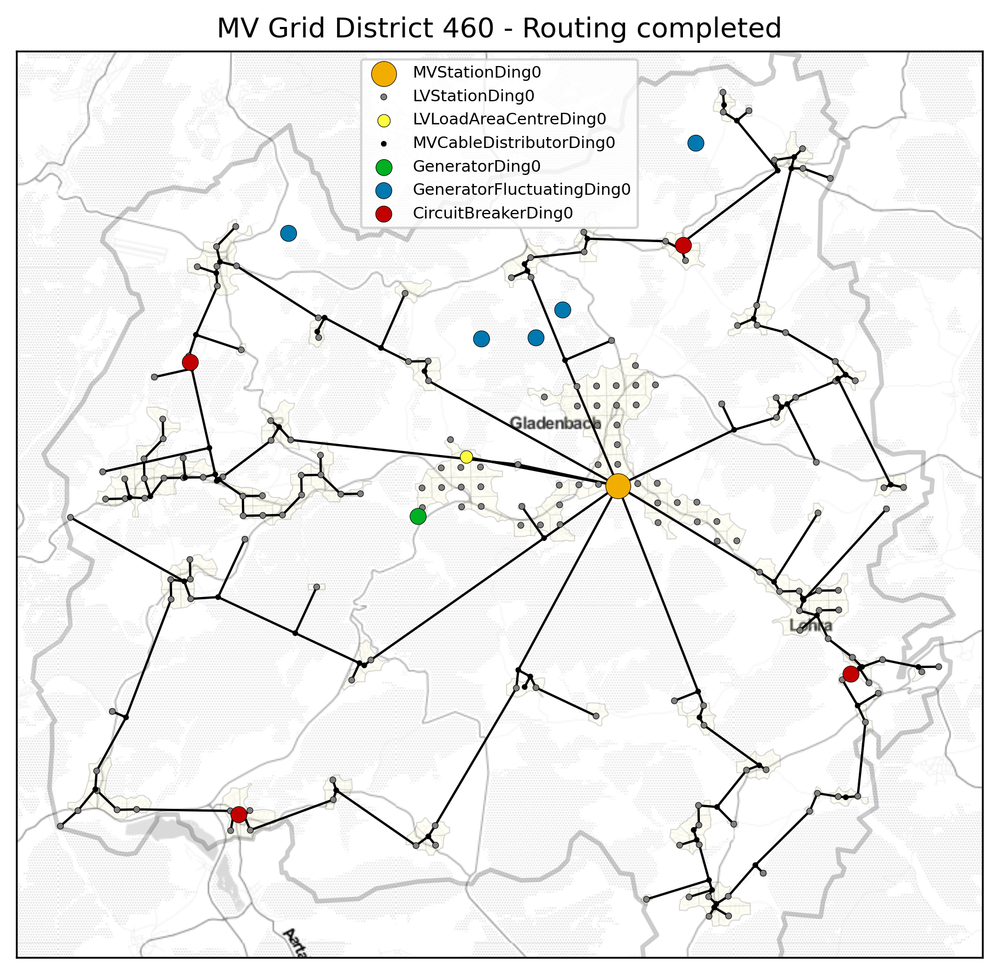

In [11]:
plot_mv_topology(grid, subtitle='Routing completed')

## 5.5 Erzeuger anschließen

In [12]:
nd.connect_generators()
nd.set_circuit_breakers()

No valid conn. target found for Generator_mvgd_460_lvgd_127332_solar_roof_mounted_863811.Connected to LVStation_mvgd_460_lvgd_127332.
No valid conn. target found for Generator_mvgd_460_lvgd_127333_solar_roof_mounted_873960.Connected to LVStation_mvgd_460_lvgd_127333.
No valid conn. target found for Generator_mvgd_460_lvgd_399941_solar_roof_mounted_863828.Connected to LVStation_mvgd_460_lvgd_399941.
No valid conn. target found for Generator_mvgd_460_lvgd_131998_solar_roof_mounted_873938.Connected to LVStation_mvgd_460_lvgd_131998.
No valid conn. target found for Generator_mvgd_460_lvgd_133651_solar_roof_mounted_874882.Connected to LVStation_mvgd_460_lvgd_133651.
No valid conn. target found for Generator_mvgd_460_lvgd_401632_solar_roof_mounted_874118.Connected to LVStation_mvgd_460_lvgd_401632.
No valid conn. target found for Generator_mvgd_460_lvgd_401632_solar_roof_mounted_874931.Connected to LVStation_mvgd_460_lvgd_401632.
No valid conn. target found for Generator_mvgd_460_lvgd_134178

/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is dep

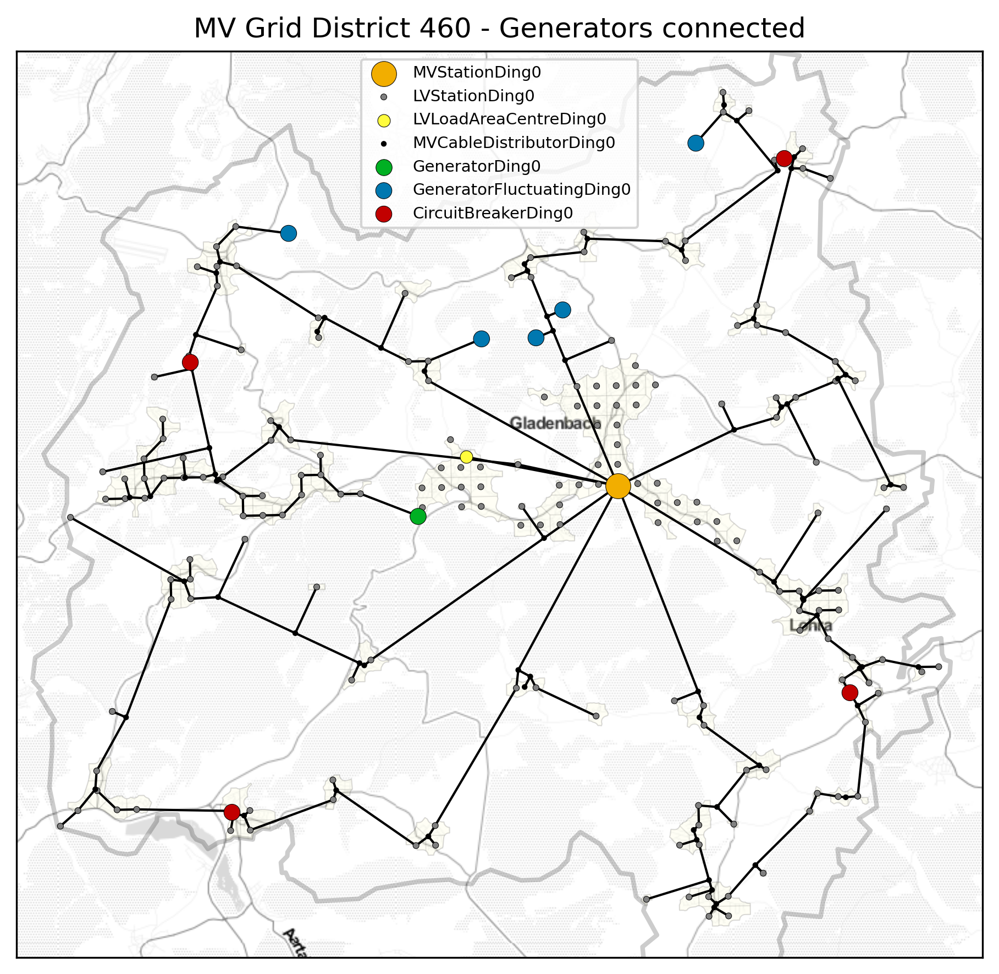

In [13]:
plot_mv_topology(grid, subtitle='Generators connected')

## 5.6 Lastflussberechnung durchführen

In [14]:
nd.control_circuit_breakers(mode='open')
nd.run_powerflow(session)

/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1970-01-01 00:00:00', '1970-01-01 01:00:00'], dtype='datetime64[ns]', freq='H')
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.036890 seconds
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.039290 seconds


/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is dep

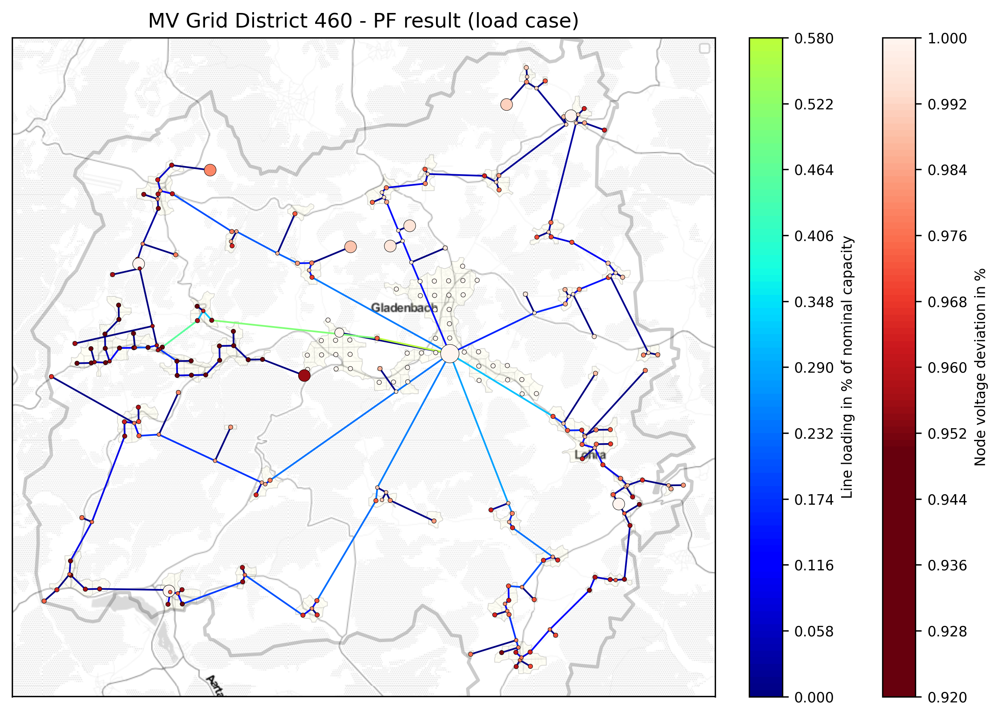

In [15]:
plot_mv_topology(grid, subtitle='PF result (load case)',
                 line_color='loading', node_color='voltage', testcase='load')

/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is dep

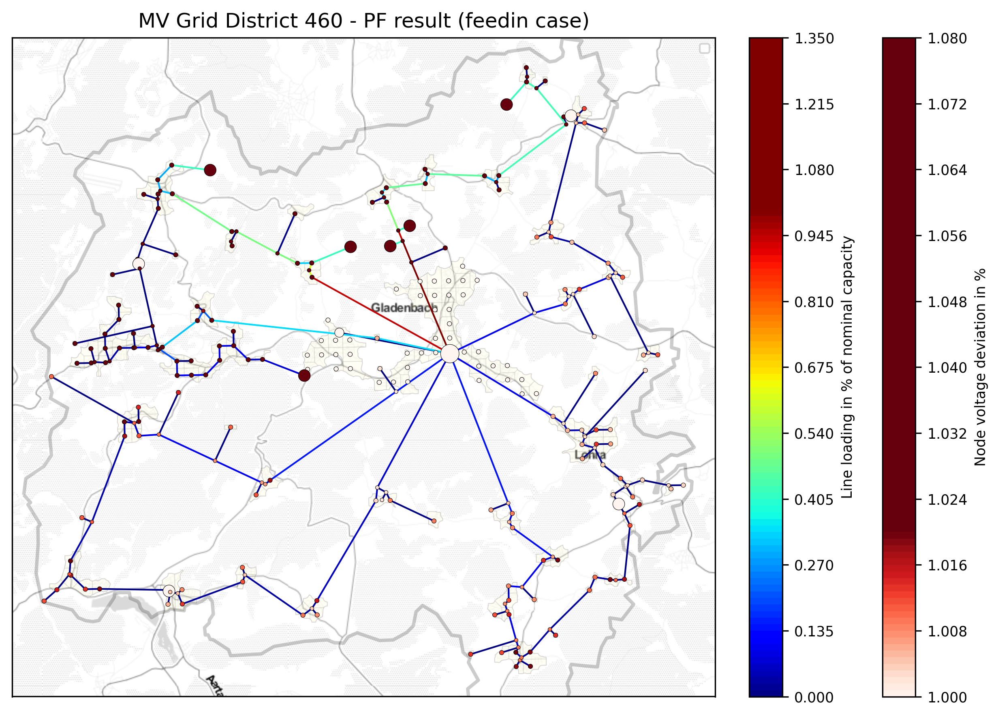

In [16]:
plot_mv_topology(grid, subtitle='PF result (feedin case)',
                 line_color='loading', node_color='voltage', testcase='feedin')

## 5.7 MS-Netze verstärken

In [17]:
nd.reinforce_grid()

INFO:ding0:==> 92 nodes have voltage issues.
INFO:ding0:==> 125 branches were reinforced.
INFO:ding0:MV grid 460 exported to pypsa format.
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1970-01-01 00:00:00', '1970-01-01 01:00:00'], dtype='datetime64[ns]', freq='H')
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.038287 seconds
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.039956 seconds
INFO:ding0:==> 69 nodes have voltage issues.
INFO:ding0:==> 102 branches were reinforced.
INFO:ding0:MV grid 460 exported to pypsa format.
/home/

INFO:ding0:==> 17 branches were reinforced.
INFO:ding0:MV grid 460 exported to pypsa format.
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1970-01-01 00:00:00', '1970-01-01 01:00:00'], dtype='datetime64[ns]', freq='H')
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.037415 seconds
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.039404 seconds
INFO:ding0:==> 5 nodes have voltage issues.


INFO:ding0:MV grid 460 exported to pypsa format.
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.pf:Performing non-linear load-flow on AC sub-network SubNetwork 0 for snapshots DatetimeIndex(['1970-01-01 00:00:00', '1970-01-01 01:00:00'], dtype='datetime64[ns]', freq='H')
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.036591 seconds
INFO:pypsa.pf:Newton-Raphson solved in 3 iterations with error of 0.000000 in 0.037949 seconds
INFO:ding0:==> 5 nodes have voltage issues.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_179885
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:3

INFO:ding0:0 in lv_grid_127330 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_127331
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_127331 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_127332
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:36 in lv_grid_127332 have voltage issues
INFO:ding0:==> 51 branches were reinforced.
INFO:ding0:==> 43 branches were reinforced.
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_127333
INFO:ding0:0 have been reinforced du

INFO:ding0:==> 28 branches were reinforced.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_131543
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_131543 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 1 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_131544
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_131544 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_131551
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:3 in lv_grid_131551 have voltage issues
INFO:ding0:==> 11 branches were reinforced.
INFO:ding0:==> All voltage issues in LV grid could be solv

INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_131998 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_513211
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_513211 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_402809
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_402809 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_401639
INFO:ding0:0 have been reinforced due to overloading issues.
INF

INFO:ding0:40 in lv_grid_133653 have voltage issues
INFO:ding0:==> 48 branches were reinforced.
INFO:ding0:==> 45 branches were reinforced.
INFO:ding0:==> 37 branches were reinforced.
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_133654
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:24 in lv_grid_133654 have voltage issues
INFO:ding0:==> 45 branches were reinforced.
INFO:ding0:==> 29 branches were reinforced.
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_400542
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_400542 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 w

INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_134951
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:9 in lv_grid_134951 have voltage issues
INFO:ding0:==> 60 branches were reinforced.
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_135132
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_135132 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_135133
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_135133 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 

INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_135391
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_135391 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_135392
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_135392 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_135393
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_135393 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved is

INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_136168 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_136208
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_136208 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_136209
INFO:ding0:0 have been reinforced due to overloading issues.
INFO:ding0:0 in lv_grid_136209 have voltage issues
INFO:ding0:==> All voltage issues in LV grid could be solved using reinforcement.
INFO:ding0:Out of 0 with overloading 0 remain with unresolved issues due to line overloading. LV grid: lv_grid_136210
INFO:ding0:0 have been reinforced due to overloading issues.
INF

# 6 Ergebnisse <a class="anchor" id="results"></a>

/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is dep

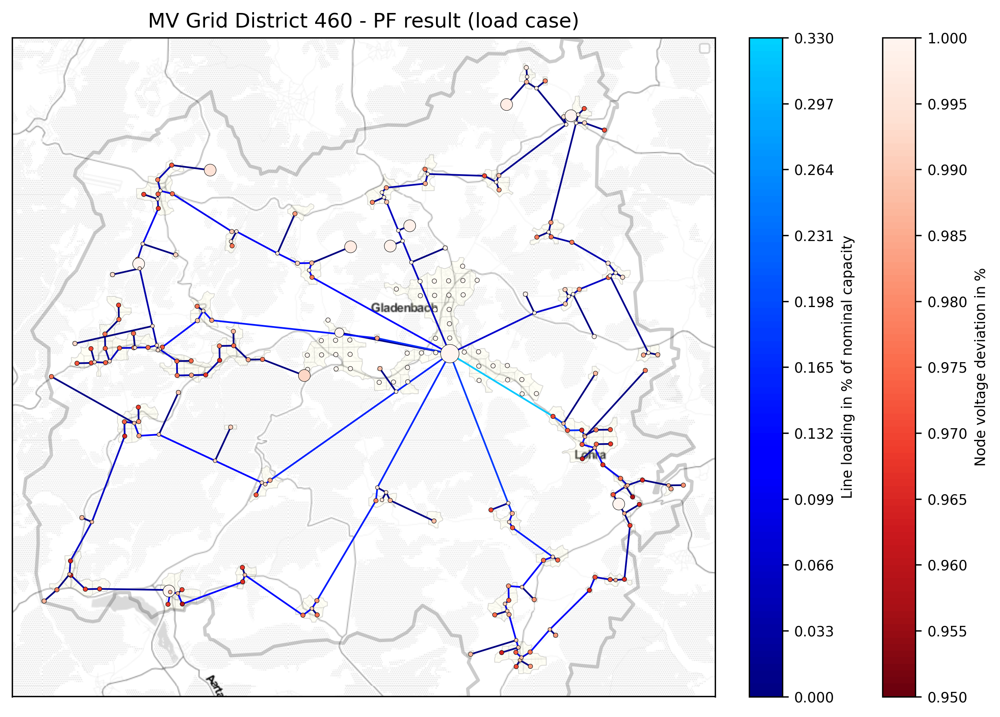

In [18]:
plot_mv_topology(grid, subtitle='PF result (load case)',
                 line_color='loading', node_color='voltage', testcase='load')

/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:294: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  projstring = _prepare_from_string(" ".join((projstring, projkwargs)))
/home/nesnoj/miniconda3/envs/ding0_workshop_env/lib/python3.8/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is dep

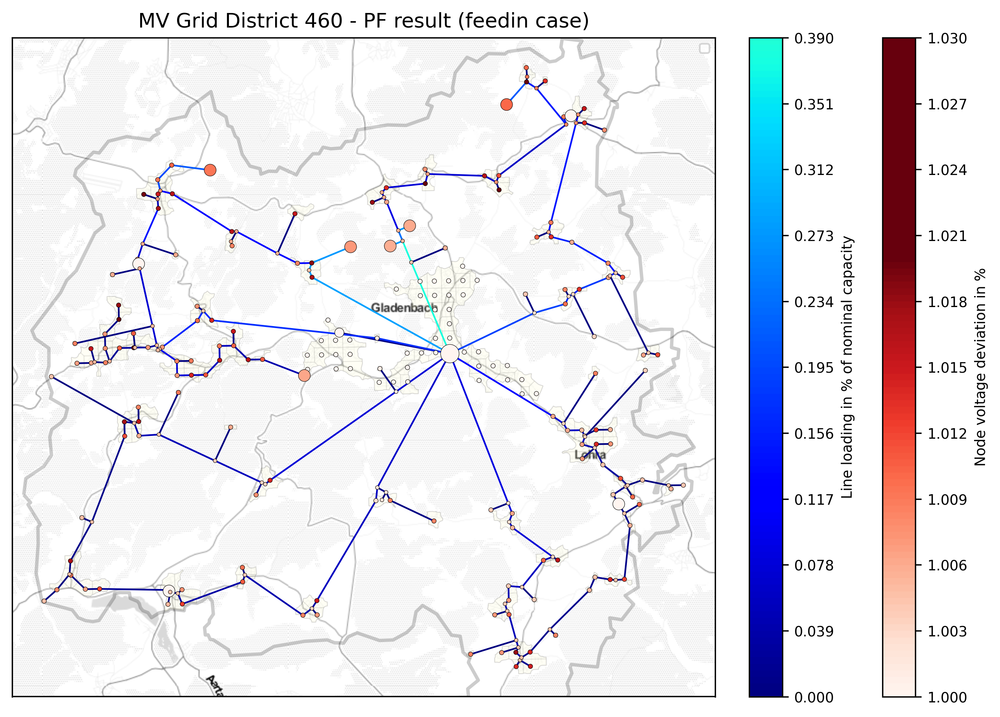

In [19]:
plot_mv_topology(grid, subtitle='PF result (feedin case)',
                 line_color='loading', node_color='voltage', testcase='feedin')

# 7 In DINGOs Datenmodell arbeiten <a class="anchor" id="use-dingo"></a>
DINGOs Datenmodell abstrahiert reale Strukturen:

<img src="https://gist.githubusercontent.com/nesnoj/6ee605cd3494fa6e3e848385c4afbe19/raw/a883b1bdc69c0c5bbb0b00ba92f43033aa86ec64/dingo_model.png" alt="DINGO Model" width="800"  align="center">

Um dies zu verdeutlichen, sehen wir uns dies top-down an, ausgehend von der `NetworkDing0`-Instanz, die wir eingangs erstellt haben:

In [20]:
nd

network

### MS-Netzgebiete (MV Grid Districts):

In [21]:
list(nd.mv_grid_districts())

[mv_grid_district_460]

### Das MV Grid District enthält das MS-Netz und die Lastgebiete (LV Load Areas):

In [22]:
nd._mv_grid_districts[0].mv_grid

mv_grid_460

In [23]:
list(nd._mv_grid_districts[0].lv_load_areas())

[lv_load_area_104648,
 lv_load_area_83084,
 lv_load_area_83135,
 lv_load_area_83207,
 lv_load_area_84427,
 lv_load_area_84575,
 lv_load_area_84649,
 lv_load_area_84661,
 lv_load_area_84667,
 lv_load_area_84688,
 lv_load_area_84692,
 lv_load_area_84827,
 lv_load_area_84876,
 lv_load_area_84889,
 lv_load_area_84907,
 lv_load_area_84924,
 lv_load_area_85138,
 lv_load_area_85156,
 lv_load_area_85290,
 lv_load_area_85334,
 lv_load_area_85335,
 lv_load_area_85395,
 lv_load_area_85396,
 lv_load_area_85398,
 lv_load_area_85519,
 lv_load_area_85532,
 lv_load_area_85655,
 lv_load_area_85790,
 lv_load_area_85854,
 lv_load_area_85925,
 lv_load_area_86017,
 lv_load_area_86026,
 lv_load_area_86117,
 lv_load_area_86144,
 lv_load_area_86169,
 lv_load_area_86246,
 lv_load_area_86279,
 lv_load_area_86324,
 lv_load_area_86431,
 lv_load_area_86446,
 lv_load_area_86448,
 lv_load_area_86449,
 lv_load_area_86450,
 lv_load_area_86493,
 lv_load_area_86540,
 lv_load_area_86591,
 lv_load_area_86600,
 lv_load_are

### Die Lastgebiete enthalten jeweils NS-Netzgebiete (LV Grid Districts):

In [24]:
list(nd._mv_grid_districts[0]._lv_load_areas[0].lv_grid_districts())

[lv_grid_district_127329,
 lv_grid_district_127330,
 lv_grid_district_127331,
 lv_grid_district_127332,
 lv_grid_district_127333]

### Mit jeweils einem NS-Netz:

In [25]:
nd._mv_grid_districts[0]._lv_load_areas[0]._lv_grid_districts[0].lv_grid

lv_grid_127330

### Jedem Netz (MS oder NS) ist ein Graph zugeordnet, der alle Knoten (Stations, Loads, ...) und Kanten (Leitungen) enthält:

In [26]:
nd._mv_grid_districts[0].mv_grid._graph

In [27]:
nd._mv_grid_districts[0].mv_grid._graph.nodes()

NodeView((MVStation_mvgd_460, LVStation_mvgd_460_lvgd_127330, LVStation_mvgd_460_lvgd_127329, LVStation_mvgd_460_lvgd_127331, LVStation_mvgd_460_lvgd_127332, LVStation_mvgd_460_lvgd_127333, LVStation_mvgd_460_lvgd_402231, LVStation_mvgd_460_lvgd_402819, LVStation_mvgd_460_lvgd_399941, LVStation_mvgd_460_lvgd_399742, LVStation_mvgd_460_lvgd_400196, LVStation_mvgd_460_lvgd_402115, LVStation_mvgd_460_lvgd_402945, LVStation_mvgd_460_lvgd_131197, LVStation_mvgd_460_lvgd_131199, LVStation_mvgd_460_lvgd_131198, LVStation_mvgd_460_lvgd_131206, LVStation_mvgd_460_lvgd_131205, LVStation_mvgd_460_lvgd_131444, LVStation_mvgd_460_lvgd_131520, LVStation_mvgd_460_lvgd_131523, LVStation_mvgd_460_lvgd_131525, LVStation_mvgd_460_lvgd_131521, LVStation_mvgd_460_lvgd_131522, LVStation_mvgd_460_lvgd_131524, LVStation_mvgd_460_lvgd_131544, LVStation_mvgd_460_lvgd_131542, LVStation_mvgd_460_lvgd_131543, LVStation_mvgd_460_lvgd_131551, LVStation_mvgd_460_lvgd_131552, LVStation_mvgd_460_lvgd_131553, LVStation_

In [28]:
nd._mv_grid_districts[0].mv_grid._graph.edges()

EdgeView([(MVStation_mvgd_460, LVLoadAreaCentre_mvgd_460_85334), (MVStation_mvgd_460, MVCableDist_mvgd_460_6), (MVStation_mvgd_460, MVCableDist_mvgd_460_11), (MVStation_mvgd_460, MVCableDist_mvgd_460_15), (MVStation_mvgd_460, MVCableDist_mvgd_460_22), (MVStation_mvgd_460, LVStation_mvgd_460_lvgd_133447), (MVStation_mvgd_460, LVStation_mvgd_460_lvgd_401632), (MVStation_mvgd_460, MVCableDist_mvgd_460_53), (MVStation_mvgd_460, LVStation_mvgd_460_lvgd_136619), (LVStation_mvgd_460_lvgd_127330, MVCableDist_mvgd_460_27), (LVStation_mvgd_460_lvgd_127329, MVCableDist_mvgd_460_26), (LVStation_mvgd_460_lvgd_127331, MVCableDist_mvgd_460_26), (LVStation_mvgd_460_lvgd_127331, MVCableDist_mvgd_460_28), (LVStation_mvgd_460_lvgd_127332, MVCableDist_mvgd_460_27), (LVStation_mvgd_460_lvgd_127333, MVCableDist_mvgd_460_3), (LVStation_mvgd_460_lvgd_127333, MVCableDist_mvgd_460_28), (LVStation_mvgd_460_lvgd_402231, MVCableDist_mvgd_460_2), (LVStation_mvgd_460_lvgd_402819, MVCableDist_mvgd_460_3), (LVStation_

In [29]:
list(nd._mv_grid_districts[0].mv_grid._graph.nodes())[0].__dict__.keys()

dict_keys(['id_db', 'geo_data', 'grid', '_transformers', 'v_level_operation', 'voltage_res'])

# 8 Netz exportieren <a class="anchor" id="export"></a>
Im pickle-Format

In [30]:
nd.control_circuit_breakers(mode='close')
save_nd_to_pickle(nd, filename='ding0_grids__460.pkl')

INFO:ding0:=====> MV Circuit Breakers closed


Im CSV-Format

In [31]:
nd.to_csv()

INFO:ding0:=====> MV Circuit Breakers opened
INFO:ding0:MV grid 460 exported to pypsa format.
INFO:ding0:LV grid 179885 exported to pypsa format.
INFO:ding0:LV grid 179886 exported to pypsa format.
INFO:ding0:LV grid 127329 exported to pypsa format.
INFO:ding0:LV grid 127330 exported to pypsa format.
INFO:ding0:LV grid 127331 exported to pypsa format.
INFO:ding0:LV grid 127332 exported to pypsa format.
INFO:ding0:LV grid 127333 exported to pypsa format.
INFO:ding0:LV grid 402231 exported to pypsa format.
INFO:ding0:LV grid 402819 exported to pypsa format.
INFO:ding0:LV grid 399941 exported to pypsa format.
INFO:ding0:LV grid 399742 exported to pypsa format.
INFO:ding0:LV grid 400196 exported to pypsa format.
INFO:ding0:LV grid 402115 exported to pypsa format.
INFO:ding0:LV grid 402945 exported to pypsa format.
INFO:ding0:LV grid 131197 exported to pypsa format.
INFO:ding0:LV grid 131198 exported to pypsa format.
INFO:ding0:LV grid 131199 exported to pypsa format.
INFO:ding0:LV grid 131

INFO:ding0:LV grid 135394 exported to pypsa format.
INFO:ding0:LV grid 135395 exported to pypsa format.
INFO:ding0:LV grid 135396 exported to pypsa format.
INFO:ding0:LV grid 135397 exported to pypsa format.
INFO:ding0:LV grid 135398 exported to pypsa format.
INFO:ding0:LV grid 135399 exported to pypsa format.
INFO:ding0:LV grid 135400 exported to pypsa format.
INFO:ding0:LV grid 135401 exported to pypsa format.
INFO:ding0:LV grid 135402 exported to pypsa format.
INFO:ding0:LV grid 135403 exported to pypsa format.
INFO:ding0:LV grid 135404 exported to pypsa format.
INFO:ding0:LV grid 135405 exported to pypsa format.
INFO:ding0:LV grid 399421 exported to pypsa format.
INFO:ding0:LV grid 400214 exported to pypsa format.
INFO:ding0:LV grid 135900 exported to pypsa format.
INFO:ding0:LV grid 135929 exported to pypsa format.
INFO:ding0:LV grid 135930 exported to pypsa format.
INFO:ding0:LV grid 135931 exported to pypsa format.
INFO:ding0:LV grid 399236 exported to pypsa format.
INFO:ding0:L

Dieses kann anschließend in [eDisGo](https://github.com/openego/eDisGo) importiert werden, um dieses zu analysieren und Netzerweiterungsmaßnahmen durchzuführen.